# Visualize scVI embeddings
On subsets

In [1]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse
import anndata
import seaborn as sns

In [2]:
## import utils
cwd = '../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils

In [3]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/visualize_embeddings/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
    

### Load data and embeddings

In [4]:
def load_scvi_outs(adata, emb_file, load_clustering=True):
    X_scVI_emb = np.load(emb_file)
    X_scVI_umap = np.load(emb_file.rstrip(".npy") + ".UMAP.npy")
    adata.obsm["X_scvi"] = X_scVI_emb
    adata.obsm["X_umap"] = X_scVI_umap
    if load_clustering:
        X_scVI_clust = pd.read_csv(emb_file.rstrip(".npy") + ".clustering.csv", index_col=0)
        adata.obs["scvi_clusters"] = X_scVI_clust.loc[adata.obs_names]["leiden_150"].astype("category")

def load_data_split(data_dir, timestamp, split):
    # Load estimated gene dispersions for HVG selection
    # Generated running `Pan_fetal_immune/utils/PFI_pp_4_HVG_stats.py`
    adata_lognorm_var = pd.read_csv(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.var.csv'.format(t=timestamp, s=split), index_col=0)

    ### Load gex data
    adata_raw = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.h5ad'.format(t=timestamp, s=split))
    adata_raw.var_names_make_unique()

    # Load obs
    new_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.{t}.full_obs.csv".format(t=timestamp), index_col=0)
    adata_raw.obs = new_obs.loc[adata_raw.obs_names]

    ## Load var
    adata_raw.var = adata_lognorm_var.copy()

    ## Add batch key
    adata_raw.obs["bbk"] = adata_raw.obs["method"] + adata_raw.obs["donor"]
    return(adata_raw)

In [5]:
data_dir="/nfs/team205/ed6/data/Fetal_immune/"
timestamp="20210429"

## STROMA

In [6]:
split="STROMA"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [7]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [8]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


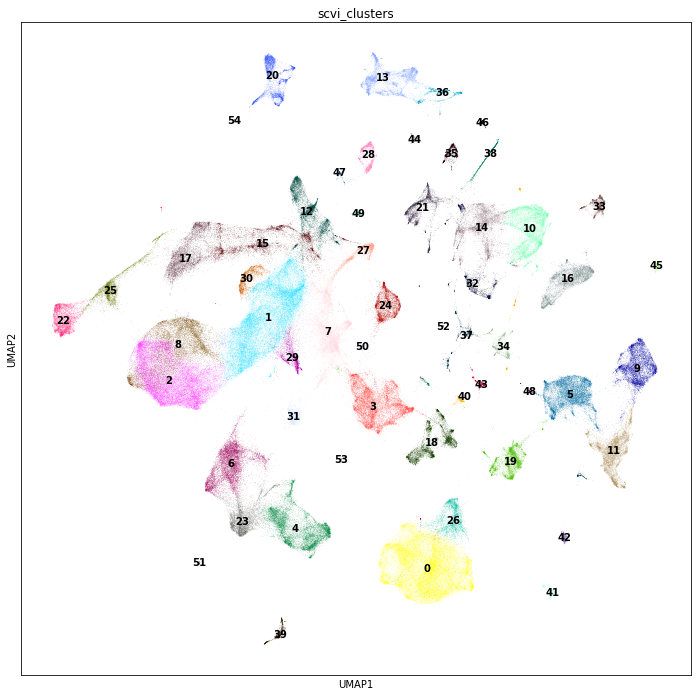

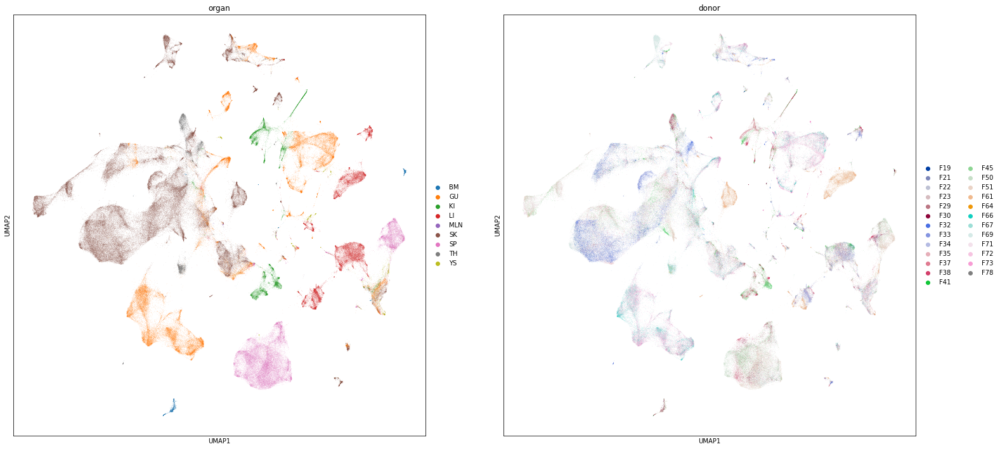

In [9]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

In [10]:
stromal_labels = adata.obs.uniform_label[adata.obs.uniform_label_lvl0.isin(['STROMAL',
 'VASCULATURE','MUSCLE','NEURAL CREST',
 'MESENCHYMAL_PROGENITOR','EPI',
 'HEPATOCYTE',
 'ADIPOSE',
 'MELANOCYTE',
 'NEURONAL',
 'OSTEOCHONDRAL',
 'KERATINOCYTES',
 'NEPHRON'])].unique()

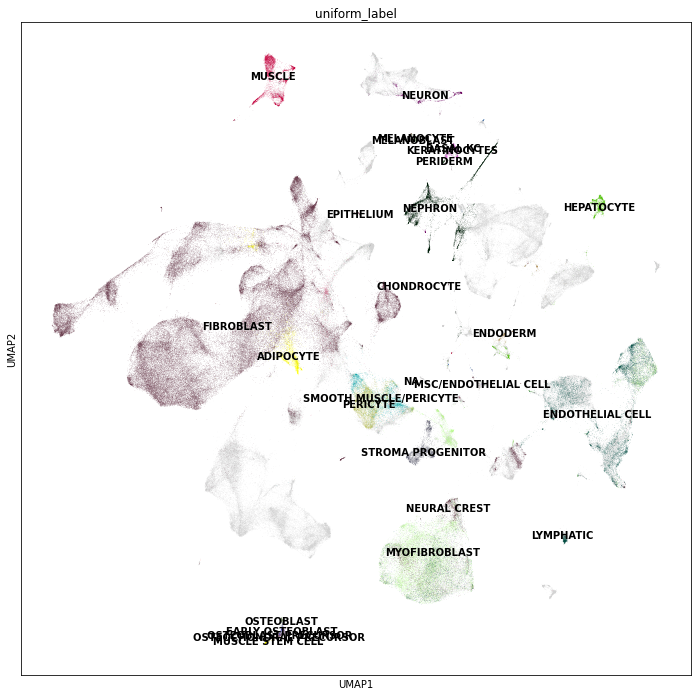

In [11]:
sc.pl.umap(adata, color=["uniform_label"], legend_loc="on data", groups=stromal_labels)

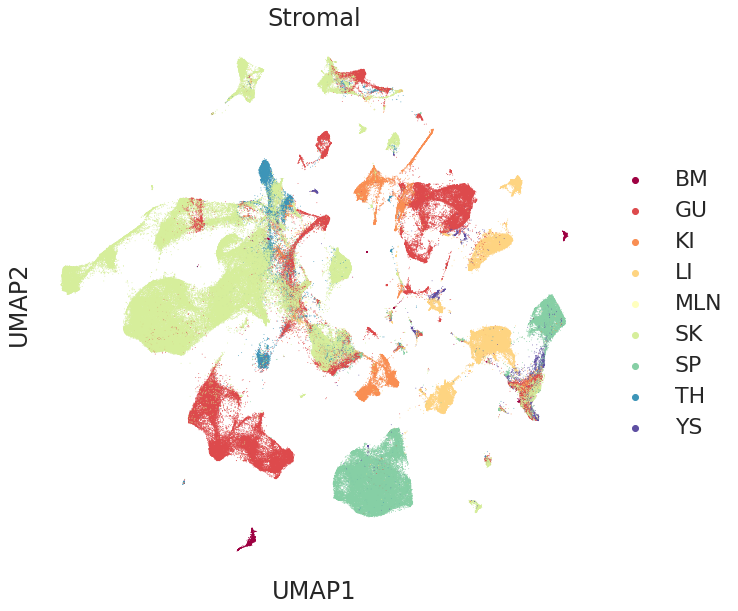

In [60]:
sns.set(font_scale=2) 
plt.rcParams["figure.figsize"] = [10,10]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
# sns.set_context("talk")
sc.pl.umap(adata, color="organ", palette="Spectral", size=3, title="Stromal", save="_stromal_organ.png")

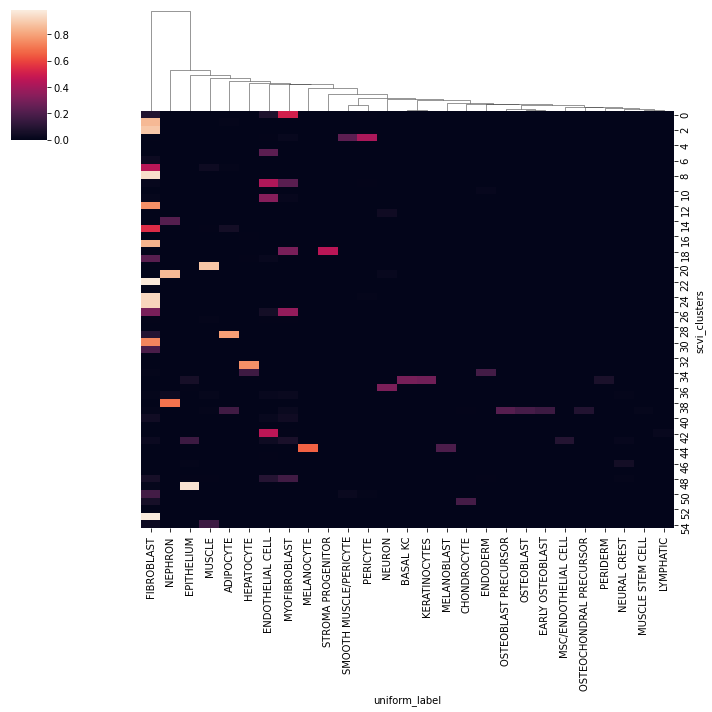

In [23]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["uniform_label"])
cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat[stromal_labels], row_cluster=False)

In [27]:
sc.pp.neighbors(adata, use_rep = "X_scvi", n_neighbors = 30, key_added="scvi")

adata.obs["leiden_150"] = adata.obs["scvi_clusters"]

adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

## ERYTHROID/MEGAKARYOCYTE

In [6]:
split="MEM_PROGENITORS"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [7]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [8]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


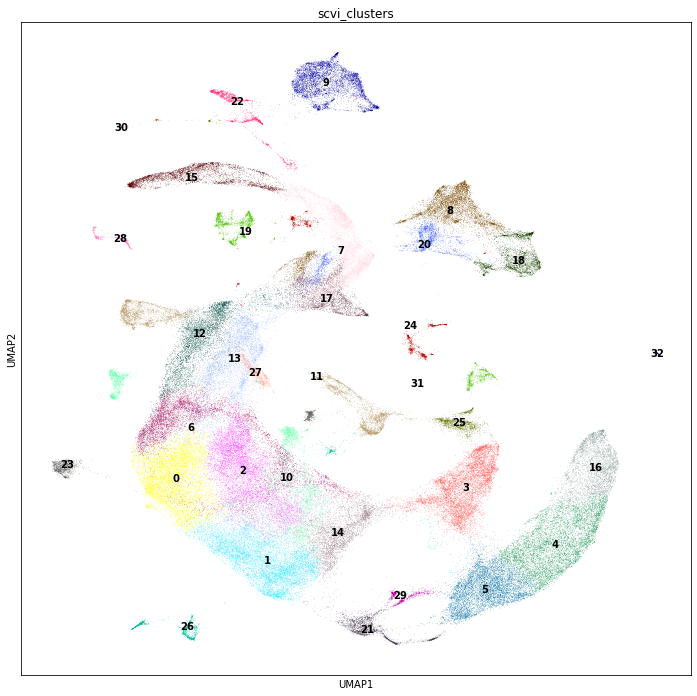

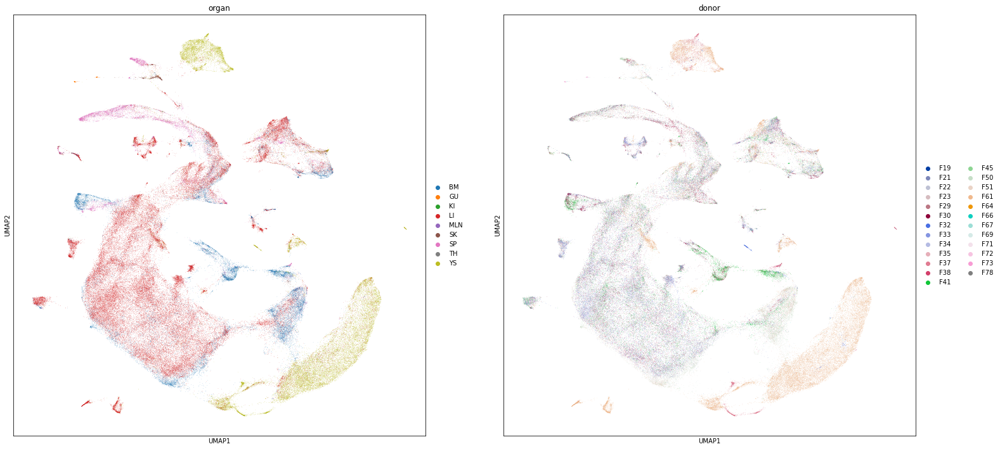

In [9]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [10]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


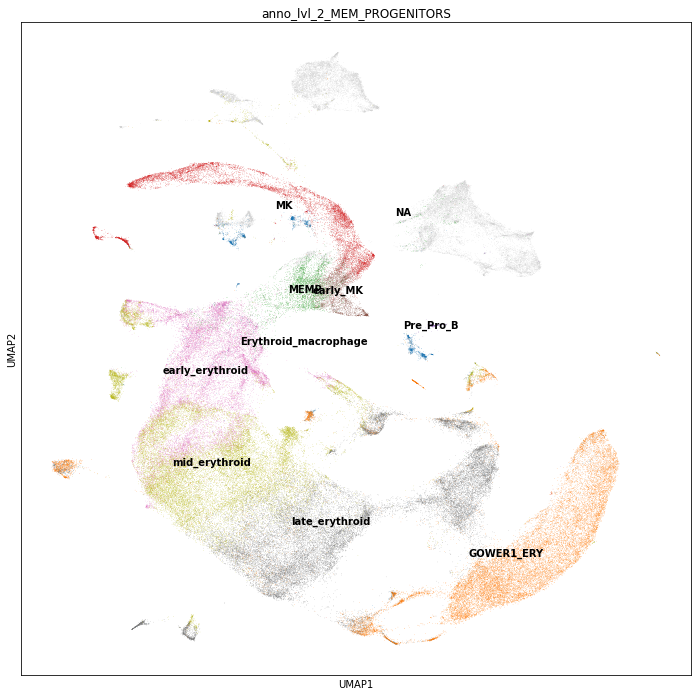

In [11]:
sc.pl.umap(adata, color=["anno_lvl_2_MEM_PROGENITORS"], legend_loc="on data")

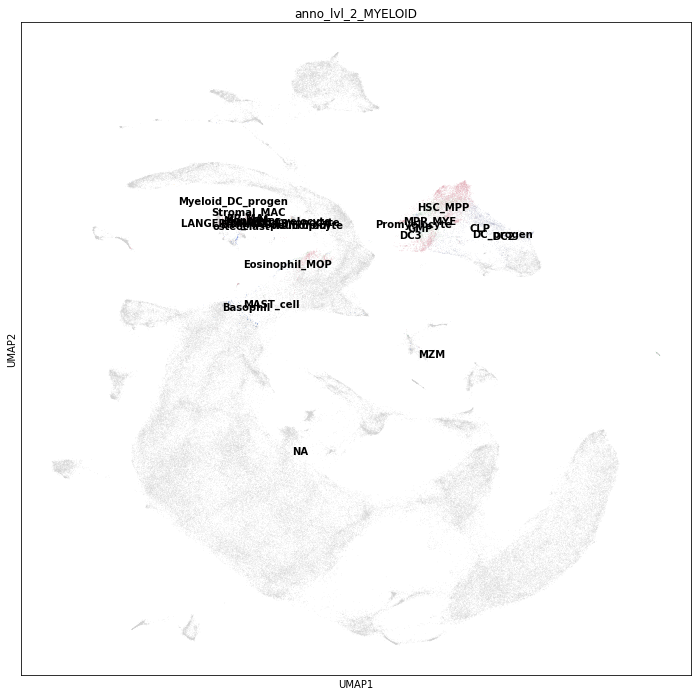

In [12]:
sc.pl.umap(adata, color=["anno_lvl_2_MYELOID"], legend_loc="on data")

In [13]:
adata.var_names = adata.var["GeneName"]

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:891: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['TSPAN6', 'TNMD', 'DPM1', 'SCYL3', 'C1orf112']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


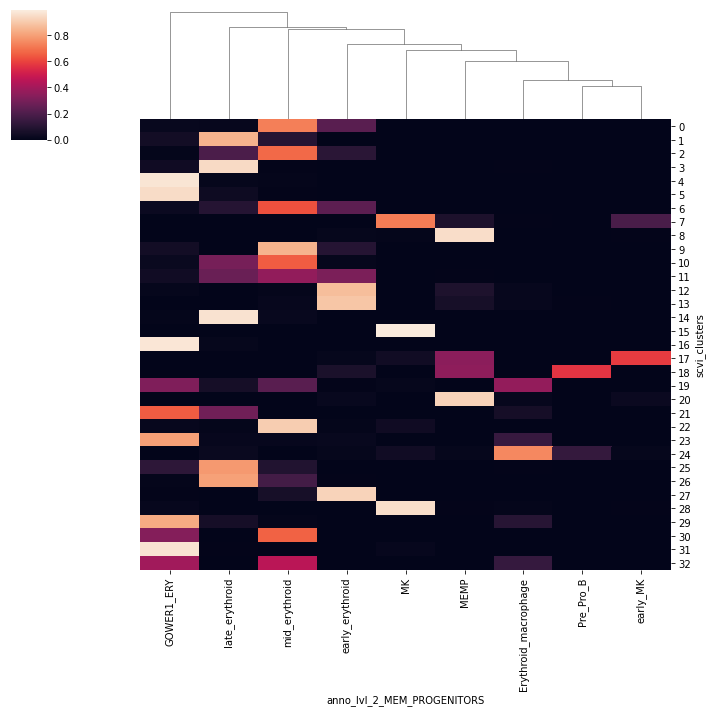

In [14]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["anno_lvl_2_MEM_PROGENITORS"])
cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat, row_cluster=False)

In [28]:
adata.obs['predicted_doublets'] = adata.obs['predicted_doublets'].astype('bool')
adata.var.index.name = 'index'
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

## MYELOID

In [43]:
split="MYELOID"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [44]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [45]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


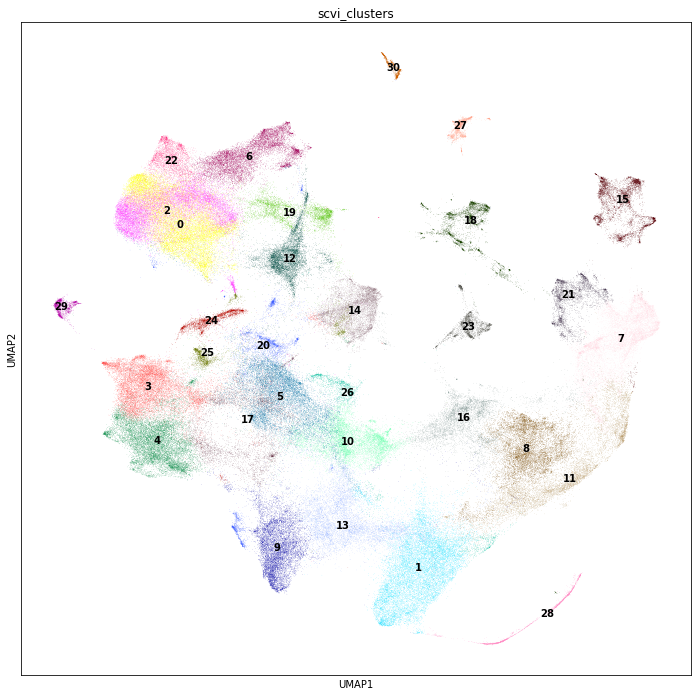

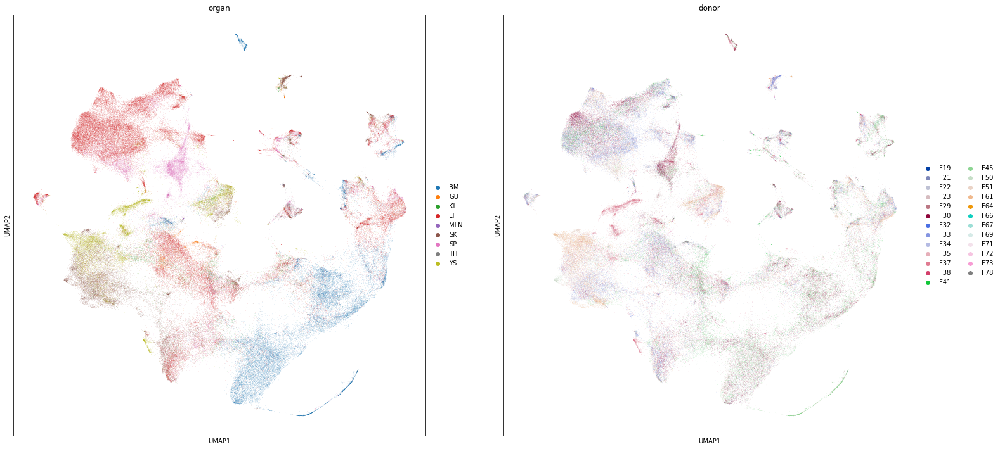

In [46]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [47]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


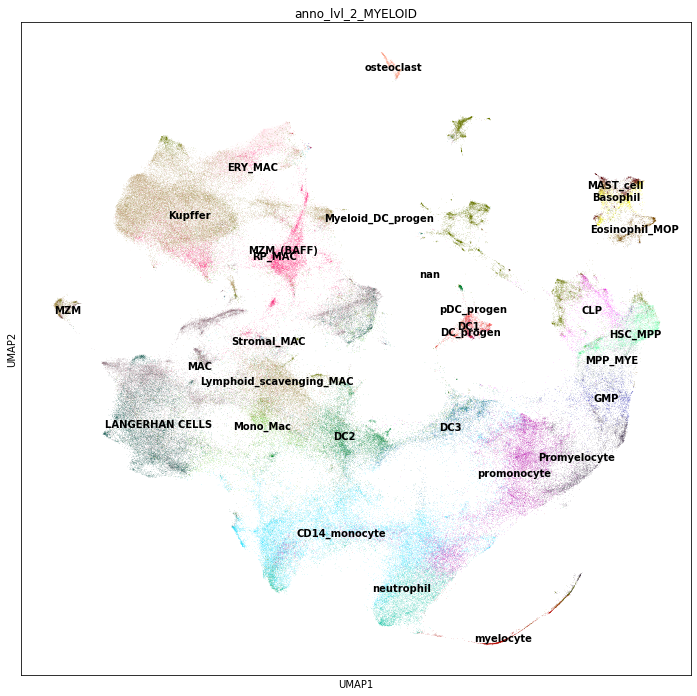

In [48]:
sc.pl.umap(adata, color=["anno_lvl_2_MYELOID"], legend_loc="on data")

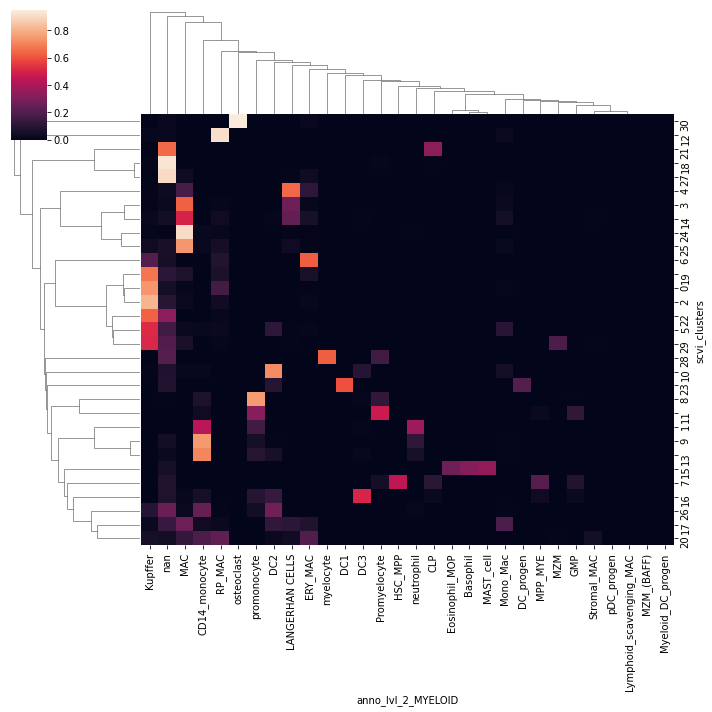

In [49]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["anno_lvl_2_MYELOID"])
cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat)

In [50]:
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

## LYMPHOID

In [96]:
split="LYMPHOID"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [97]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [98]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


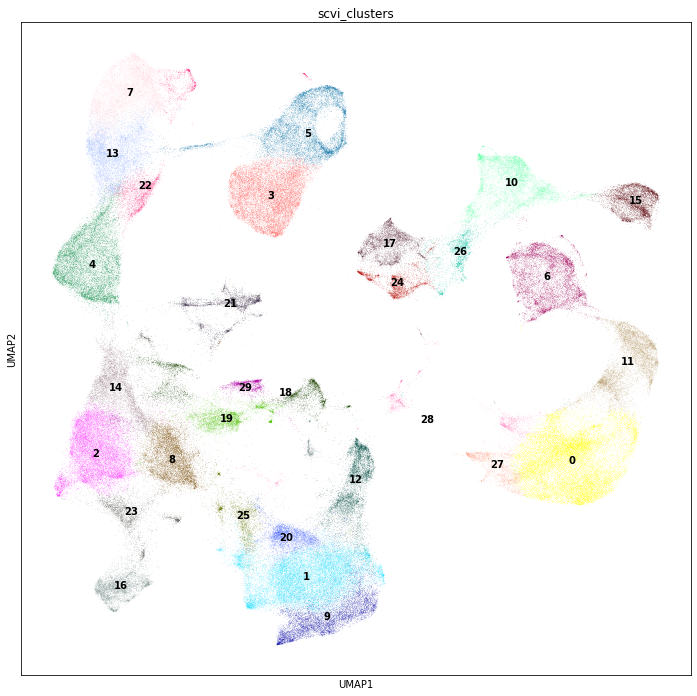

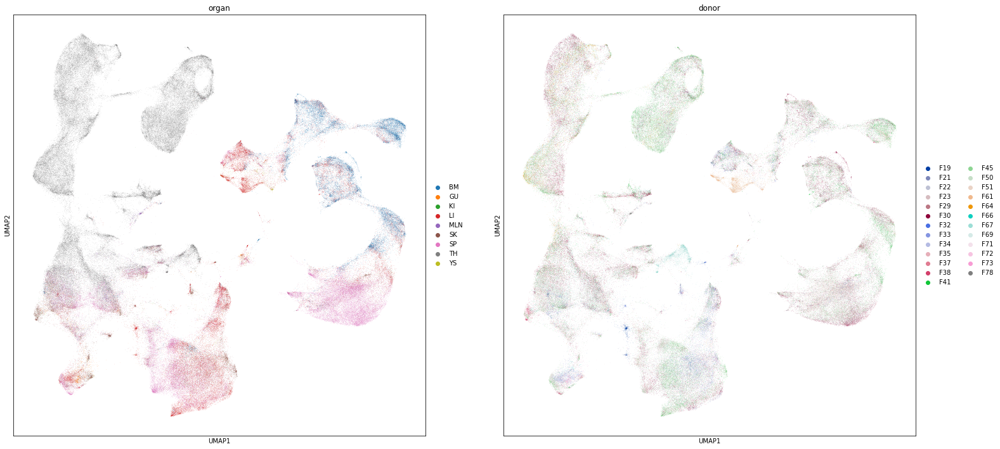

In [99]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [32]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


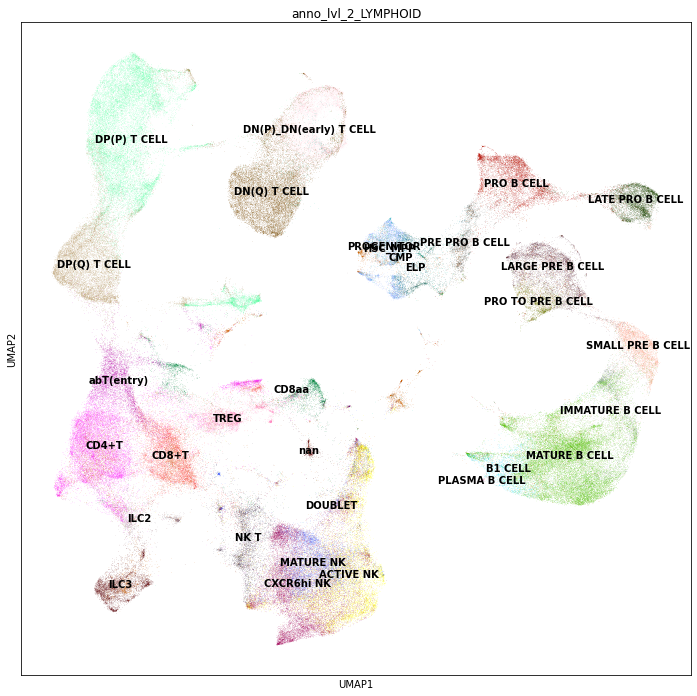

In [33]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], legend_loc="on data")

In [34]:
## Read markers
markers_dir = "/home/jovyan/mount/gdrive/Pan_fetal/significant_genes/marker genes/"
nkt_markers = pd.read_csv(markers_dir + "NKT_marker_genes.csv", header=None)
nkt_markers.columns = ["gene", "anno_lvl_2"]

In [35]:
b_markers = pd.read_csv(markers_dir + "B_marker_genes.csv", header=None)
b_markers.columns = ["gene", "anno_lvl_2"]

In [36]:
adata.obs["scvi_clusters"] = adata.obs["scvi_clusters"].astype("str").astype("category") 
sc.tl.dendrogram(adata, groupby="scvi_clusters", use_rep="X_scvi")
sc.tl.dendrogram(adata, groupby="scvi_clusters", use_rep="X_scvi")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 10, etc.
var_group_labels: DN(early), DN(P), DN(Q), etc.


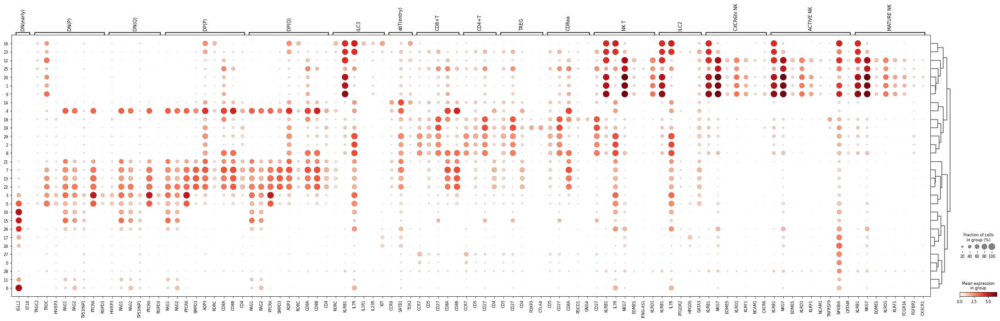

In [37]:
anno_k = nkt_markers.anno_lvl_2.unique()
marker_dict = {}
for k in anno_k:
    marker_dict[k] = nkt_markers.gene[nkt_markers.anno_lvl_2==k].tolist()
sc.pl.dotplot(adata, marker_dict, groupby="scvi_clusters", dendrogram=True)

In [38]:
# sc.pl.dotplot(adata, nkt_markers.gene.unique(), groupby="scvi_clusters", dendrogram=True)
# sc.pl.dotplot(adata, b_markers.gene.unique(), groupby="scvi_clusters", dendrogram=True)

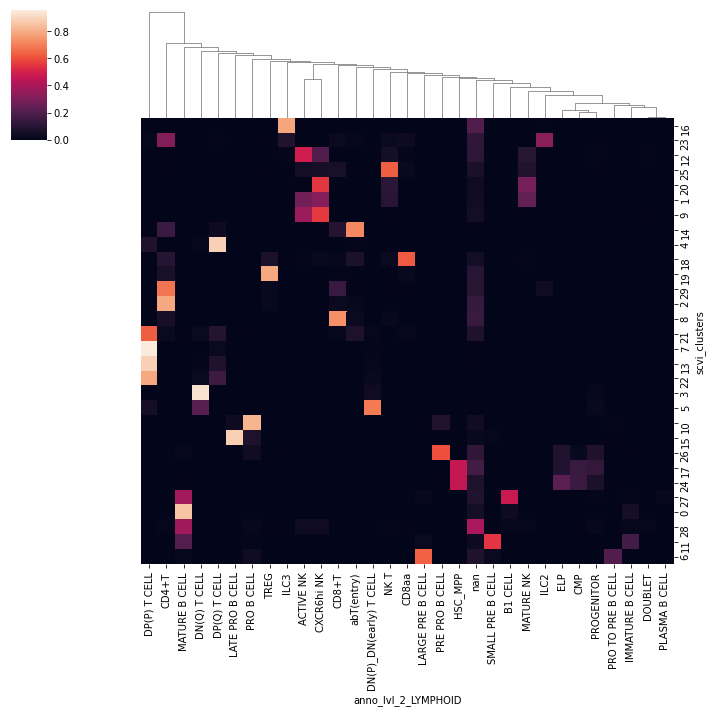

In [39]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["anno_lvl_2_LYMPHOID"])
conf_mat = conf_mat.loc[adata.uns["dendrogram_scvi_clusters"]["categories_ordered"]]

cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat, row_cluster=False)

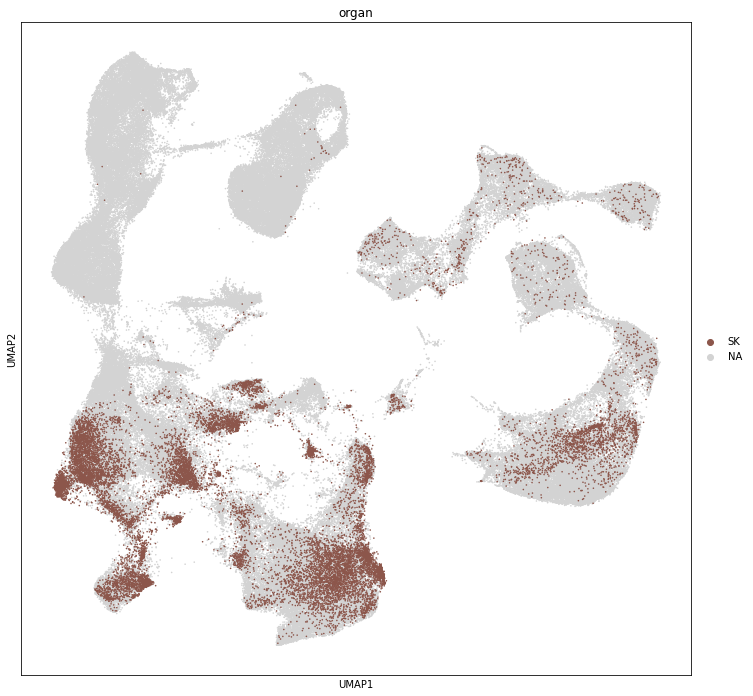

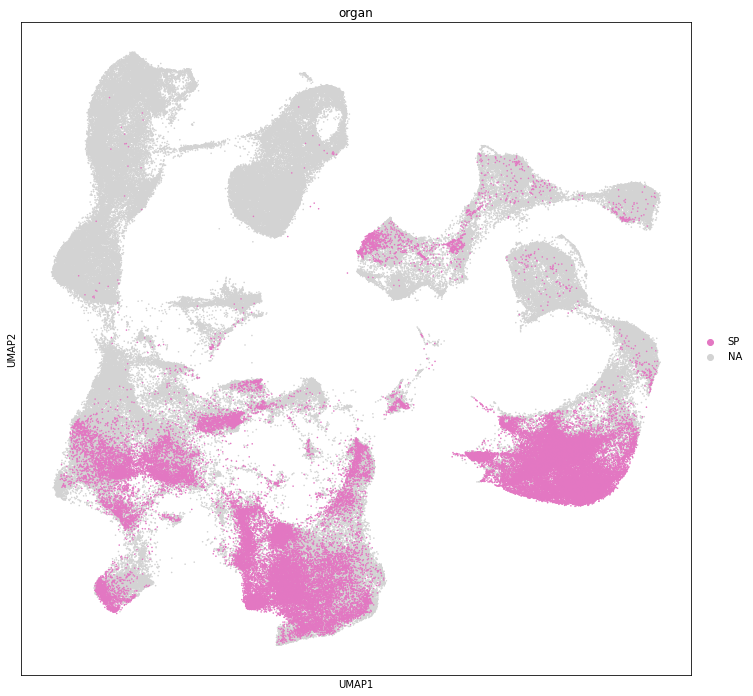

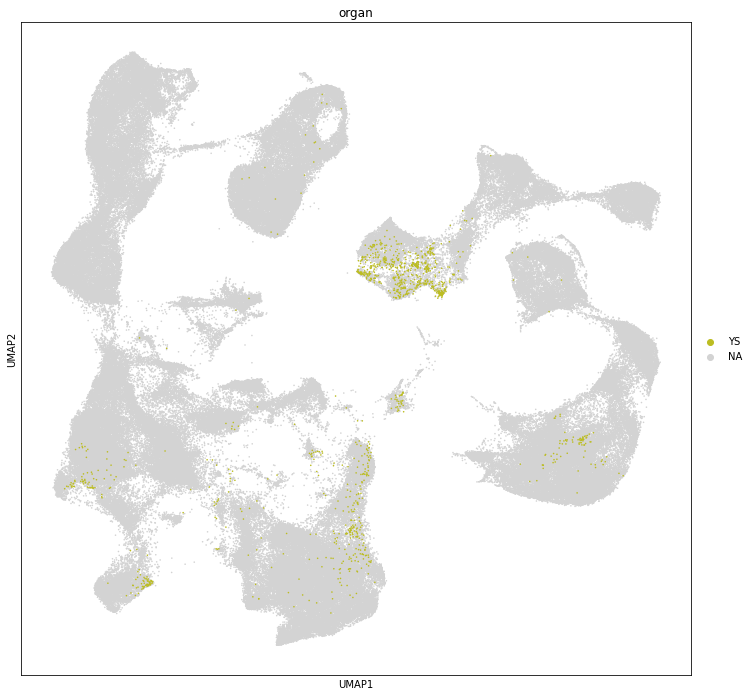

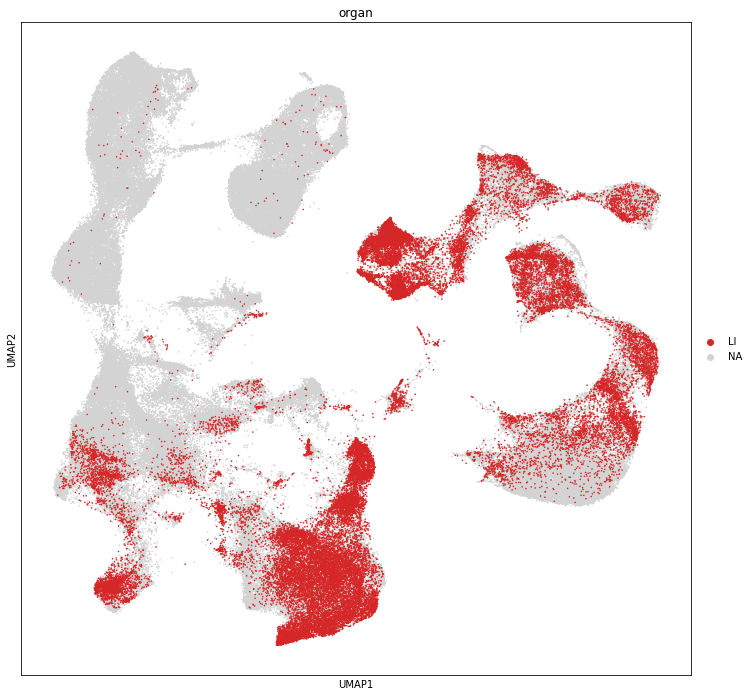

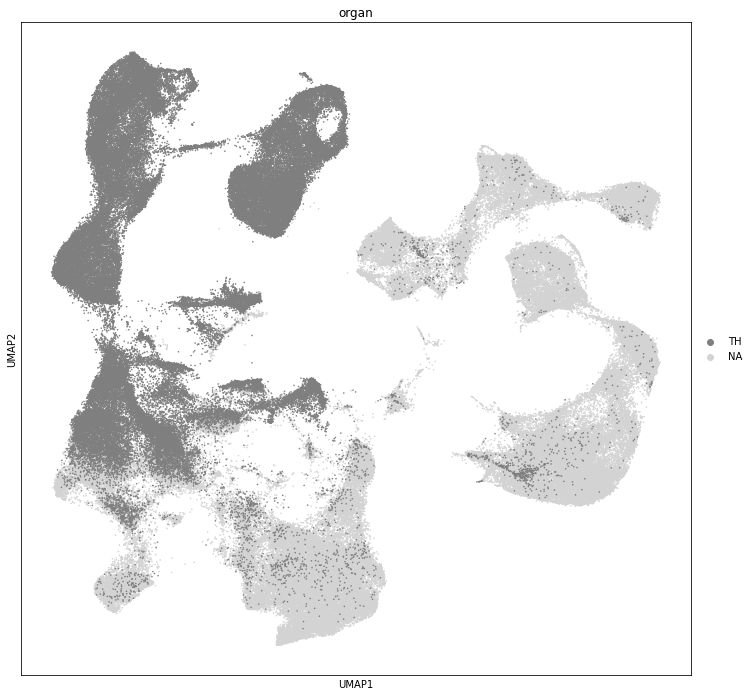

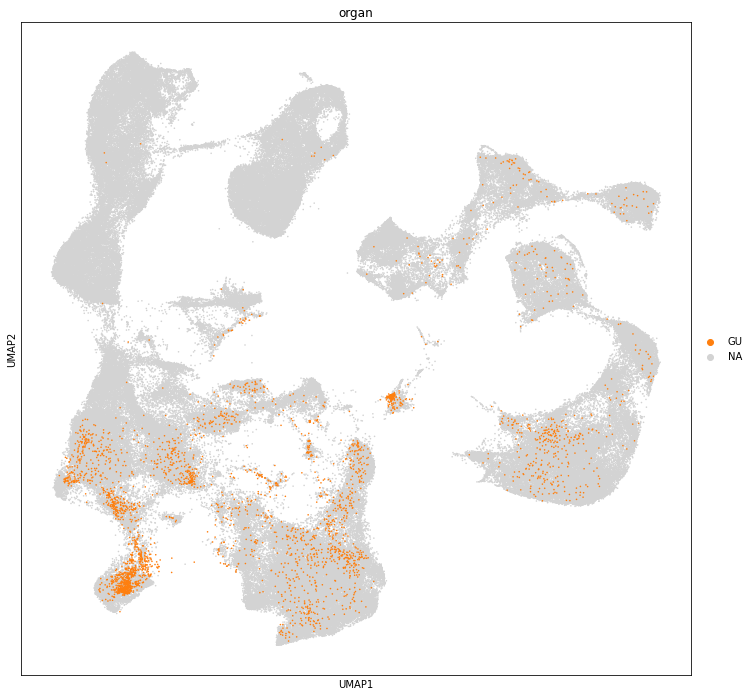

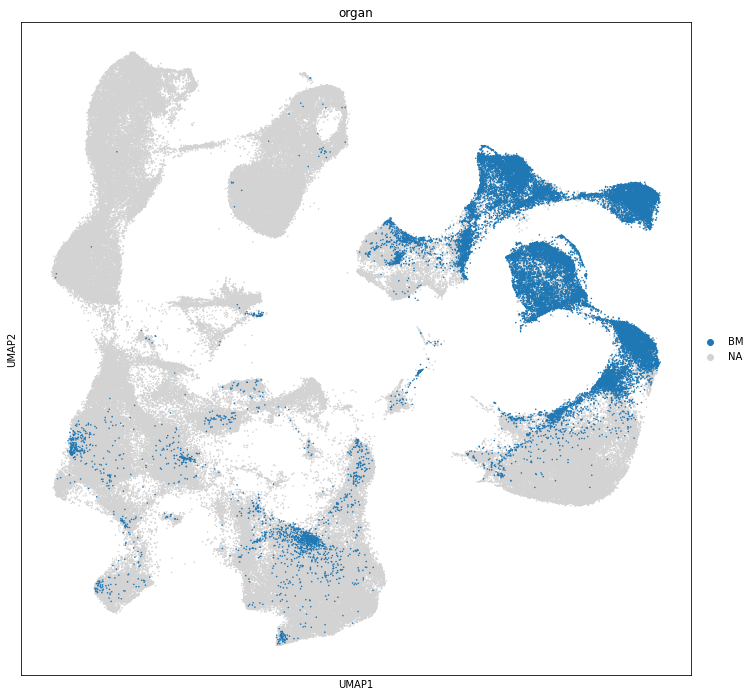

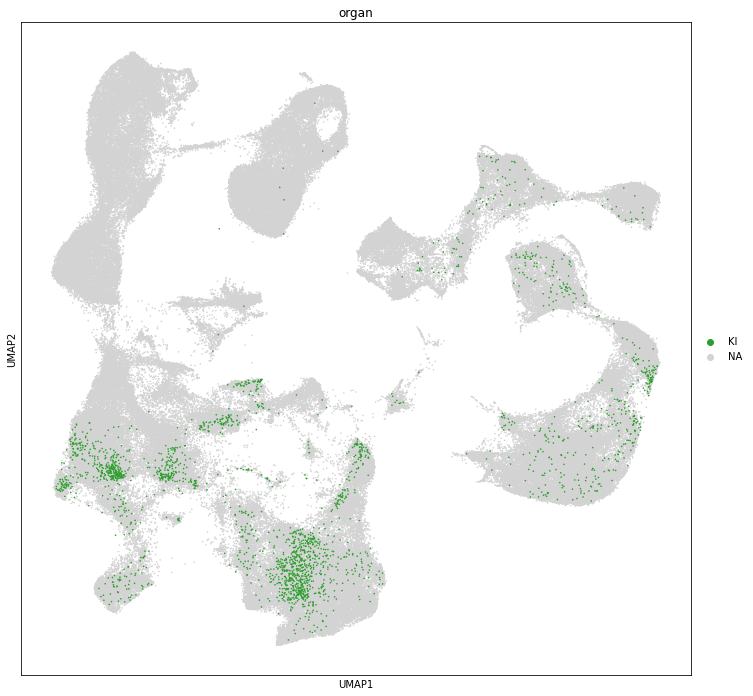

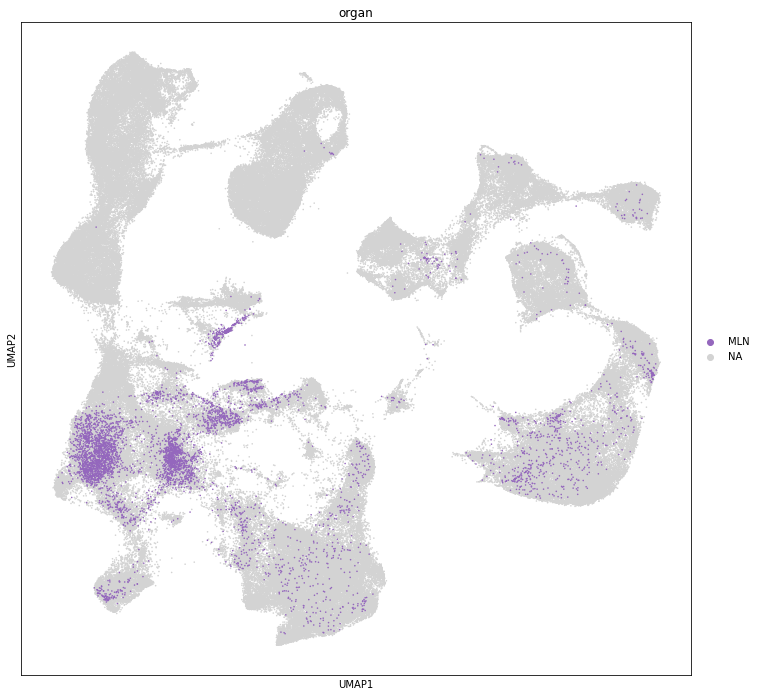

In [40]:
for o in adata.obs['organ'].unique():
    sc.pl.umap(adata, color=["organ"], groups=[o], size=10)

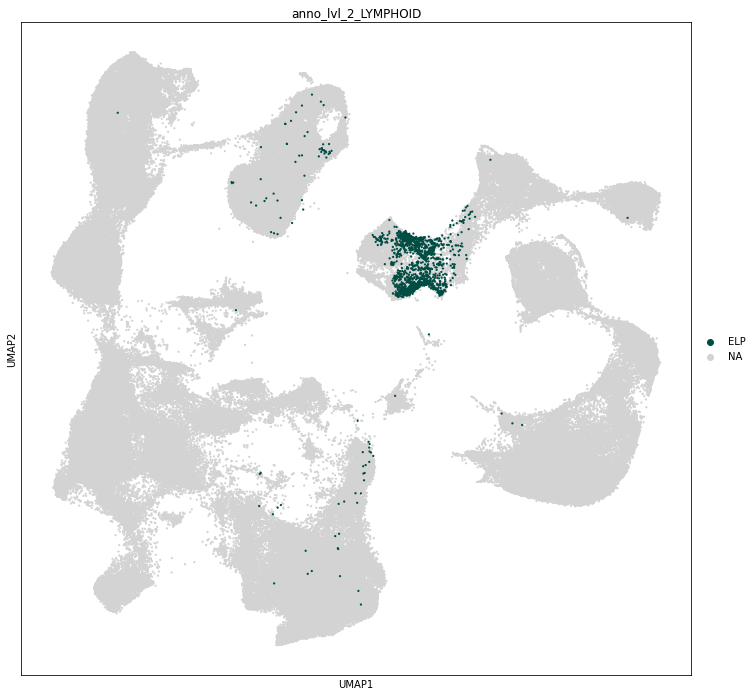

In [41]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], size=20, ncols=3, groups=["ELP"])

In [42]:
sc.pp.neighbors(adata, use_rep = "X_scvi", n_neighbors = 30, key_added="scvi")
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

### Make NKT/B cell subset

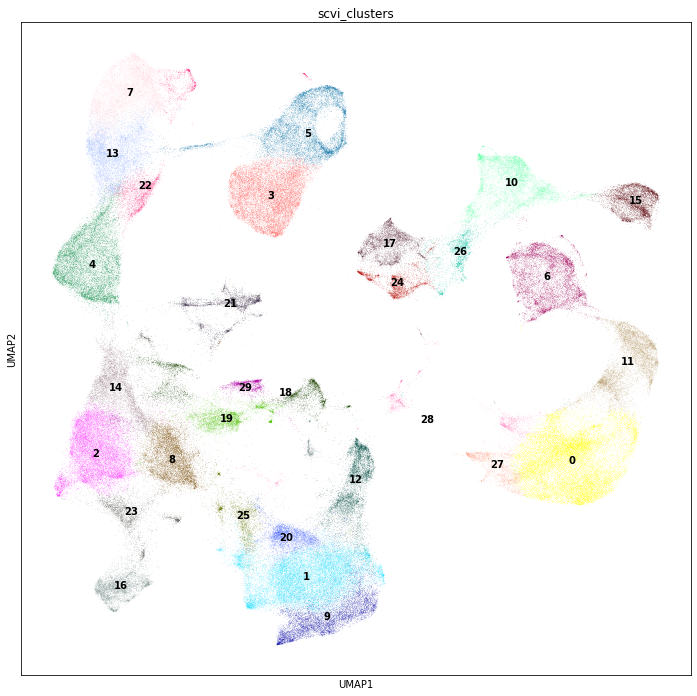

In [101]:
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")

In [111]:
b_cl = [26,10,15,6,11,0,27]
prog_cl = [17,24]
# nkt_cl = ["3","5","7","13","22","4","14","2","8"]

nkt_cl = [x for x in range(0,30) if x not in b_cl and x!=28]

In [112]:
adata.obs["isin_" + "NKT"] = adata.obs["scvi_clusters"].isin(nkt_cl)
adata.obs["isin_" + "NKT"] = adata.obs["isin_NKT"].astype("category")

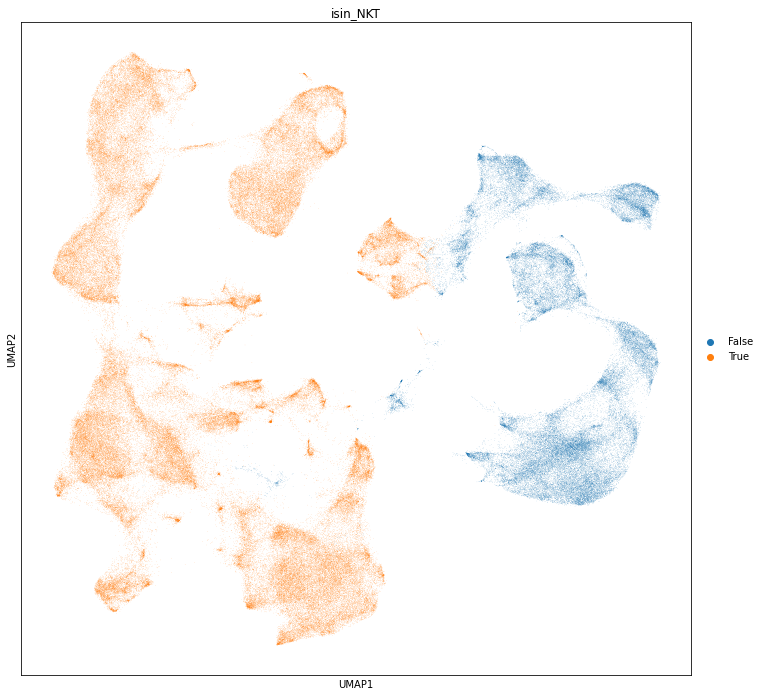

In [113]:
sc.pl.umap(adata, color="isin_NKT")

In [114]:
adata_raw = sc.read_h5ad('{d}PAN.A01.v01.entire_data_raw_count.{t}.LYMPHOID.h5ad'.format(d=data_dir, t=timestamp))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [115]:
adata_raw

AnnData object with n_obs × n_vars = 241950 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name'
    var: 'GeneID', 'GeneName'

In [116]:
s="NKT"
sdata = adata[adata.obs["isin_" + s]==True]
sdata.write_h5ad('{d}PAN.A01.v01.entire_data_normalised_log.{t}.{s}.h5ad'.format(d=data_dir, t=timestamp, s=s))
sdata_raw = adata_raw[adata.obs["isin_" + s]==True] 
sdata_raw.write_h5ad('{d}PAN.A01.v01.entire_data_raw_count.{t}.{s}.h5ad'.format(d=data_dir, t=timestamp, s=s))

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


## NK/T

In [117]:
split="NKT"
adata = load_data_split(data_dir, timestamp, split)

In [118]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [119]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


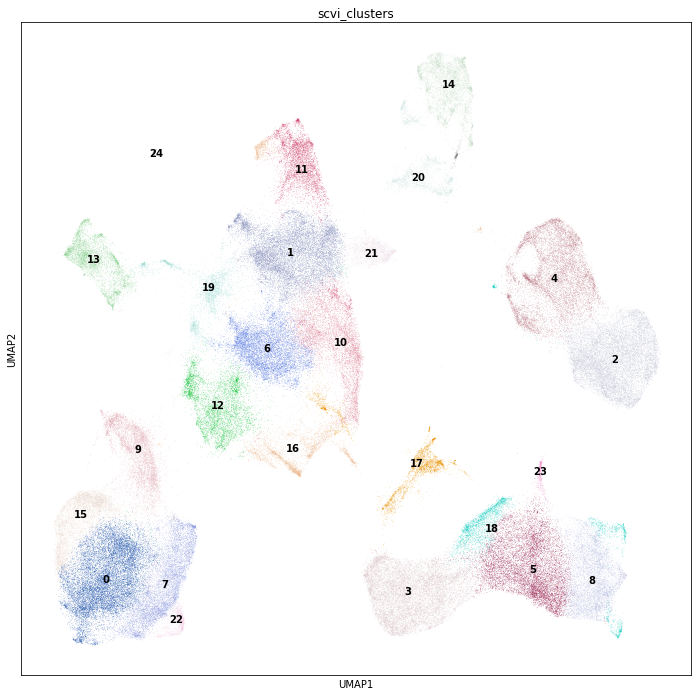

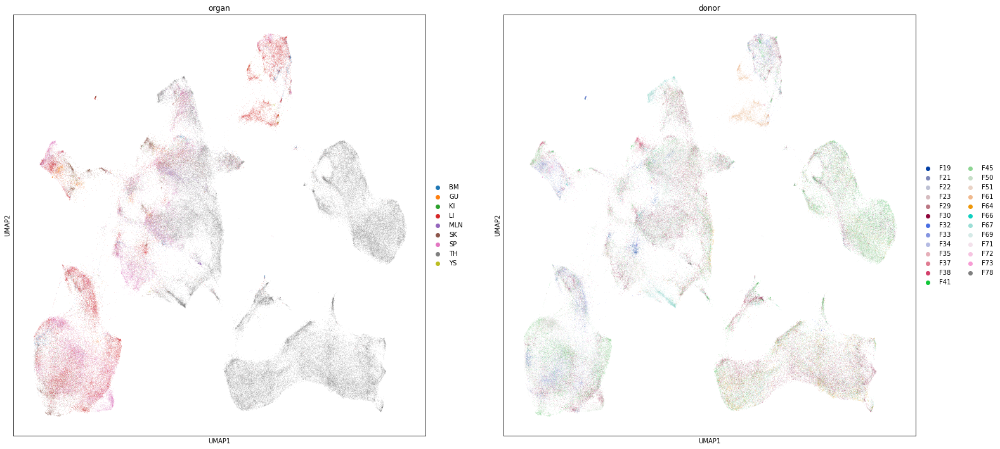

In [120]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [121]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


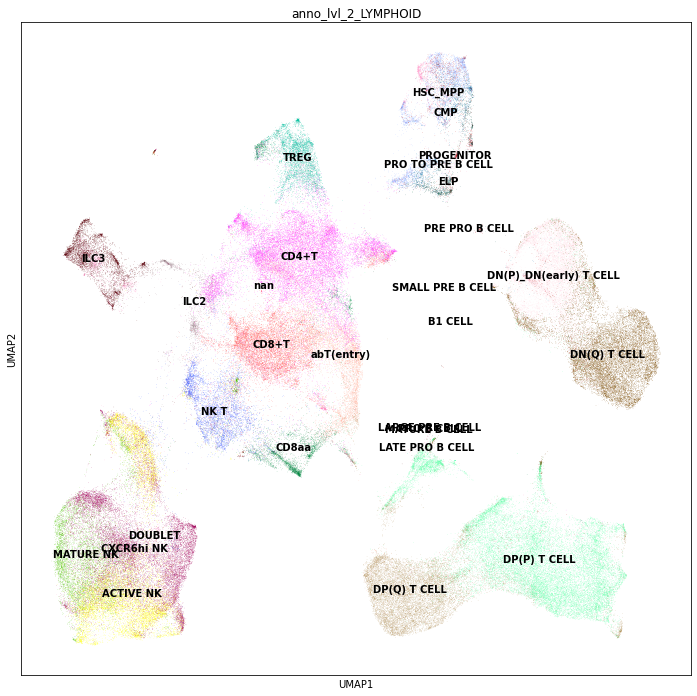

In [122]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], legend_loc="on data")

Save

In [123]:
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

### ALL HEMATOPOIETIC/IMMUNE

In [61]:
split="HSC_IMMUNE"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [62]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [63]:
load_scvi_outs(adata, emb_file, load_clustering=True)

... storing 'file' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


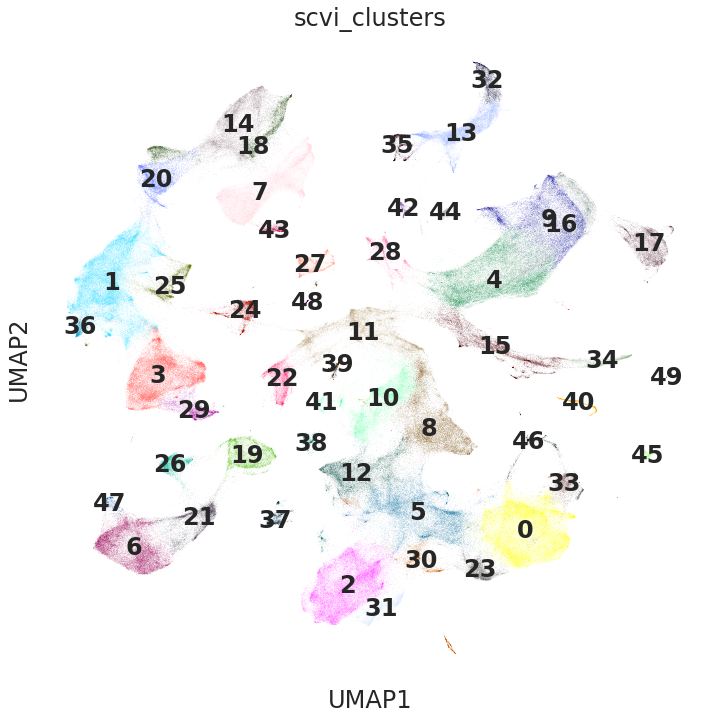

NotImplementedError: isna is not defined for MultiIndex

<Figure size 1870.56x864 with 0 Axes>

In [64]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

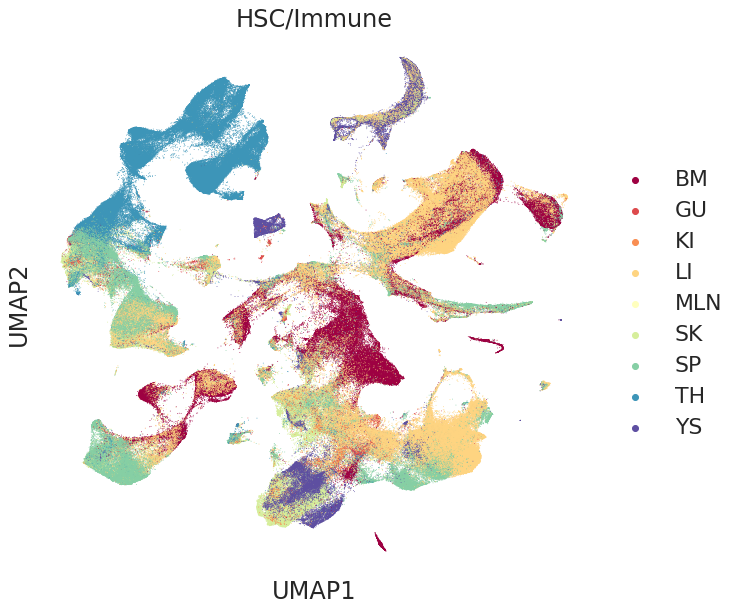

In [65]:
sns.set(font_scale=2) 
plt.rcParams["figure.figsize"] = [10,10]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
# sns.set_context("talk")
sc.pl.umap(adata, color="organ", palette="Spectral", size=3, title="HSC/Immune", save="_immune_organ.png")

In [71]:
## Sort to plot earlier first
sorted_obs = adata.obs.sort_values("age", ascending=False).index

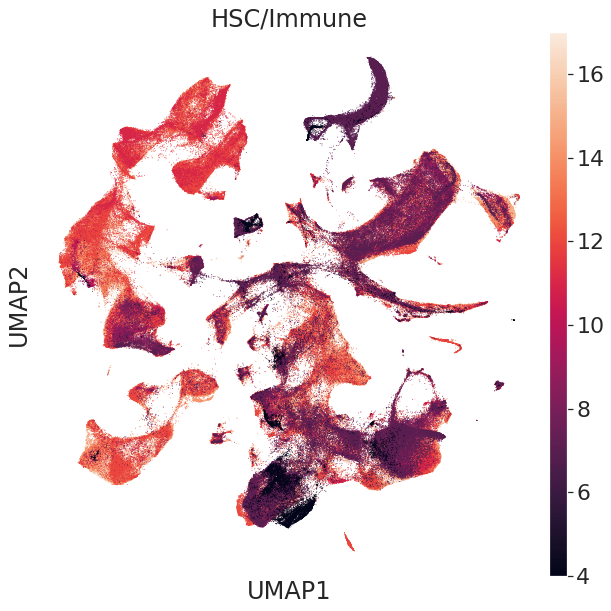

In [70]:
sns.set(font_scale=2) 
plt.rcParams["figure.figsize"] = [10,10]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
# sns.set_context("talk")
sc.pl.umap(adata[sorted_obs], color="age", size=3, title="HSC/Immune", save="_immune_age.png", sort_order=False)

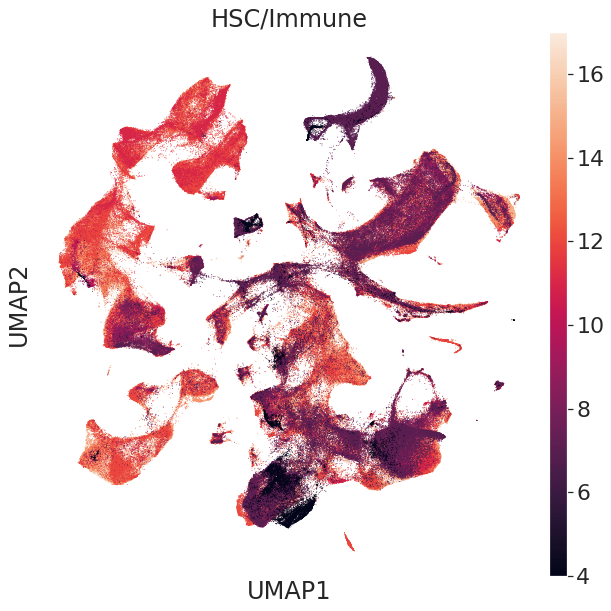

In [70]:
sns.set(font_scale=2) 
plt.rcParams["figure.figsize"] = [10,10]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
# sns.set_context("talk")
sc.pl.umap(adata[sorted_obs], color="age", size=3, title="HSC/Immune", save="_immune_age.png", sort_order=False)

In [72]:
import milopy

In [75]:
milopy.core.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

Load manual annotations

In [298]:
adata.obs = adata.obs.drop(["anno_lvl_2_LYMPHOID", "anno_lvl_2_MYELOID", "anno_lvl_2_MEM_PROGENITORS"],1)

In [299]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

In [308]:
adata.obs["anno_lvl_2_LYMPHOID"].cat.categories

Index(['ACTIVE NK', 'B1 CELL', 'CD4+T', 'CD8+T', 'CD8aa', 'CMP', 'CXCR6hi NK',
       'DN(P)_DN(early) T CELL', 'DN(Q) T CELL', 'DOUBLET', 'DP(P) T CELL',
       'DP(Q) T CELL', 'ELP', 'HSC_MPP', 'ILC2', 'ILC3', 'IMMATURE B CELL',
       'LARGE PRE B CELL', 'LATE PRO B CELL', 'MATURE B CELL', 'MATURE NK',
       'NK T', 'PLASMA B CELL', 'PRE PRO B CELL', 'PRO B CELL',
       'PRO TO PRE B CELL', 'PROGENITOR', 'SMALL PRE B CELL', 'TREG',
       'abT(entry)'],
      dtype='object')

In [305]:
adata.obs["anno_lvl_2_MEM_PROGENITORS"].cat.categories.hasnans

False

In [290]:
# adata.obs["anno_lvl_2_MEM_PROGENITORS"] = adata.obs["anno_lvl_2_MEM_PROGENITORS"].astype("str")

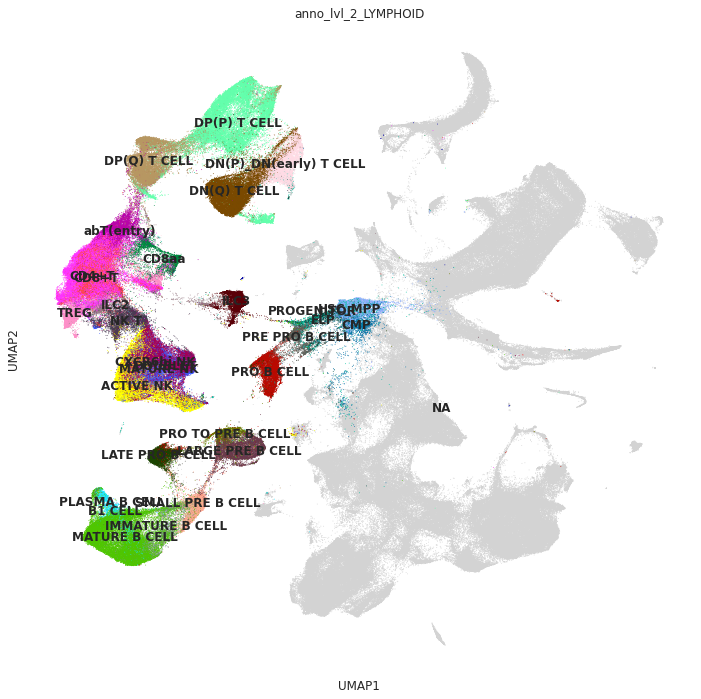

NotImplementedError: isna is not defined for MultiIndex

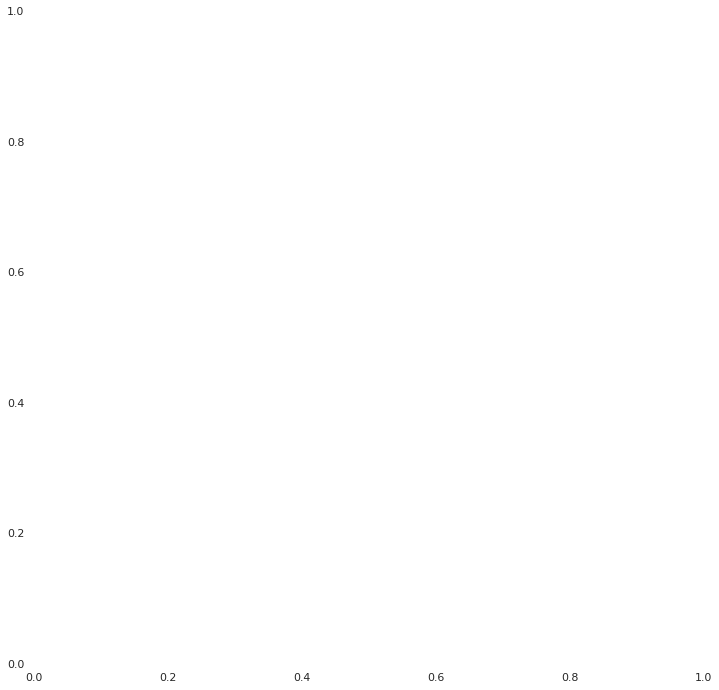

In [309]:
sns.set(font_scale=1) 
plt.rcParams["figure.figsize"] = [12,12]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], legend_loc="on data", size=3)
sc.pl.umap(adata, color=["anno_lvl_2_MEM_PROGENITORS"],  size=3)


In [247]:
adata.obs["anno_lvl_2_LYMPHOID_4_plot"] = ['ELP' if x=="PROGENITOR" else x for x in adata.obs["anno_lvl_2_LYMPHOID"].astype("str")]
adata.obs["anno_lvl_2_LYMPHOID_4_plot"] = ['NK' if x.endswith("NK") else x for x in adata.obs["anno_lvl_2_LYMPHOID_4_plot"].astype("str")]

pl_labels = adata.obs["anno_lvl_2_LYMPHOID_4_plot"].unique()[adata.obs["anno_lvl_2_LYMPHOID_4_plot"].unique()!="nan"]

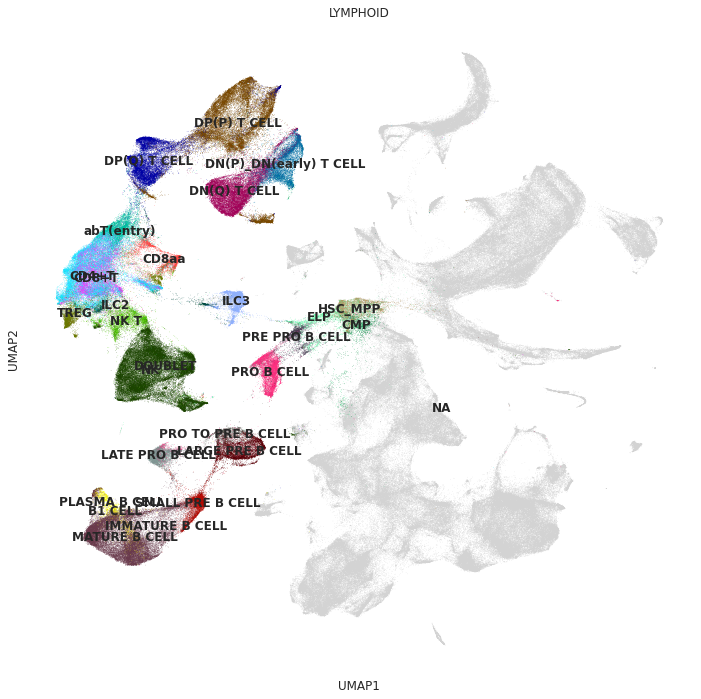

In [253]:
sns.set(font_scale=1) 
plt.rcParams["figure.figsize"] = [12,12]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID_4_plot"], 
           groups=pl_labels.tolist(),
           legend_loc="on data", size=1,
          title="LYMPHOID",
           save="hsc_immune_lymphoid.png"
          )

In [258]:
adata.obs["anno_lvl_2_MEM_PROGENITORS_4_plot"] = ['nan' if x=="Erythroid_macrophage" else x for x in adata.obs["anno_lvl_2_MEM_PROGENITORS"].astype("str")]
adata.obs["anno_lvl_2_MEM_PROGENITORS_4_plot"] = ['nan' if x=="Pre_Pro_B" else x for x in adata.obs["anno_lvl_2_MEM_PROGENITORS_4_plot"].astype("str")]


In [271]:
# adata.obs["anno_lvl_2_MEM_PROGENITORS_4_plot"] = adata.obs["anno_lvl_2_MEM_PROGENITORS_4_plot"].str.upper()
pl_labels = adata.obs["anno_lvl_2_MEM_PROGENITORS"].unique()[~adata.obs["anno_lvl_2_MEM_PROGENITORS"].unique().isin([np.nan, "Erythroid_macrophage", "Pre_Pro_B"])].tolist()

In [277]:
adata.obs["anno_lvl_2_MEM_PROGENITORS"]

,n_counts,n_genes,file,mito,doublet_scores,predicted_doublets,name,uniform_label,uniform_label_expanded_merged,uniform_label_lvl0,...,Sample,bbk,scvi_clusters,nhood_ixs_random,nhood_ixs_refined,anno_lvl_2_LYMPHOID_4_plot,anno_lvl_2_MEM_PROGENITORS_4_plot,anno_lvl_2_LYMPHOID,anno_lvl_2_MYELOID,anno_lvl_2_MEM_PROGENITORS
FCAImmP7579224-ATTACTCTCGATGAGG,61563.0,6117,FCAImmP7579224,0.036321,0.087221,False,FCAImmP7579224_filtered.h5ad,NaN,NaN,NaN,...,F45_SK_CD45P_FCAImmP7579224,5GEXF45,10,0,0,nan,nan,NaN,DC3,NaN
FCAImmP7579224-CAGCCGAGTACATCCA,61511.0,6658,FCAImmP7579224,0.051909,0.125320,False,FCAImmP7579224_filtered.h5ad,NaN,NaN,NaN,...,F45_SK_CD45P_FCAImmP7579224,5GEXF45,4,0,0,nan,nan,NaN,NaN,NaN
FCAImmP7579224-TGCTACCTCATGTAGC,54545.0,6485,FCAImmP7579224,0.045284,0.164087,False,FCAImmP7579224_filtered.h5ad,NaN,NaN,NaN,...,F45_SK_CD45P_FCAImmP7579224,5GEXF45,10,0,0,nan,nan,NaN,MPP_MYE,NaN
FCAImmP7579224-ACGGCCACAAGCTGAG,51992.0,5768,FCAImmP7579224,0.040083,0.092437,False,FCAImmP7579224_filtered.h5ad,NaN,NaN,NaN,...,F45_SK_CD45P_FCAImmP7579224,5GEXF45,12,0,0,nan,nan,NaN,CD14_monocyte,NaN
FCAImmP7579224-CTAATGGCACTGTGTA,51305.0,5492,FCAImmP7579224,0.046467,0.176471,False,FCAImmP7579224_filtered.h5ad,NaN,NaN,NaN,...,F45_SK_CD45P_FCAImmP7579224,5GEXF45,19,0,0,LARGE PRE B CELL,nan,LARGE PRE B CELL,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FCAImmP7803042-TTTGGTTCAGTTCCCT,6716.0,1975,FCAImmP7803042,0.018761,0.044364,False,FCAImmP7803042_filtered.h5ad,NaN,NaN,NaN,...,F51_SK_CD45N_FCAImmP7803042,5GEXF51,42,0,0,nan,nan,NaN,NaN,NaN
FCAImmP7803042-TCTCATATCCTATGTT,6573.0,786,FCAImmP7803042,0.051270,0.240506,False,FCAImmP7803042_filtered.h5ad,NaN,NaN,NaN,...,F51_SK_CD45N_FCAImmP7803042,5GEXF51,46,0,0,nan,mid_erythroid,NaN,NaN,mid_erythroid
FCAImmP7803042-TCAACGATCATTGCGA,5300.0,1667,FCAImmP7803042,0.030755,0.140449,False,FCAImmP7803042_filtered.h5ad,NaN,NaN,NaN,...,F51_SK_CD45N_FCAImmP7803042,5GEXF51,42,0,0,nan,nan,NaN,NaN,NaN
FCAImmP7803042-CATGGCGCACAGACAG,4536.0,1591,FCAImmP7803042,0.021384,0.029138,False,FCAImmP7803042_filtered.h5ad,NaN,NaN,NaN,...,F51_SK_CD45N_FCAImmP7803042,5GEXF51,42,0,0,nan,nan,NaN,NaN,NaN


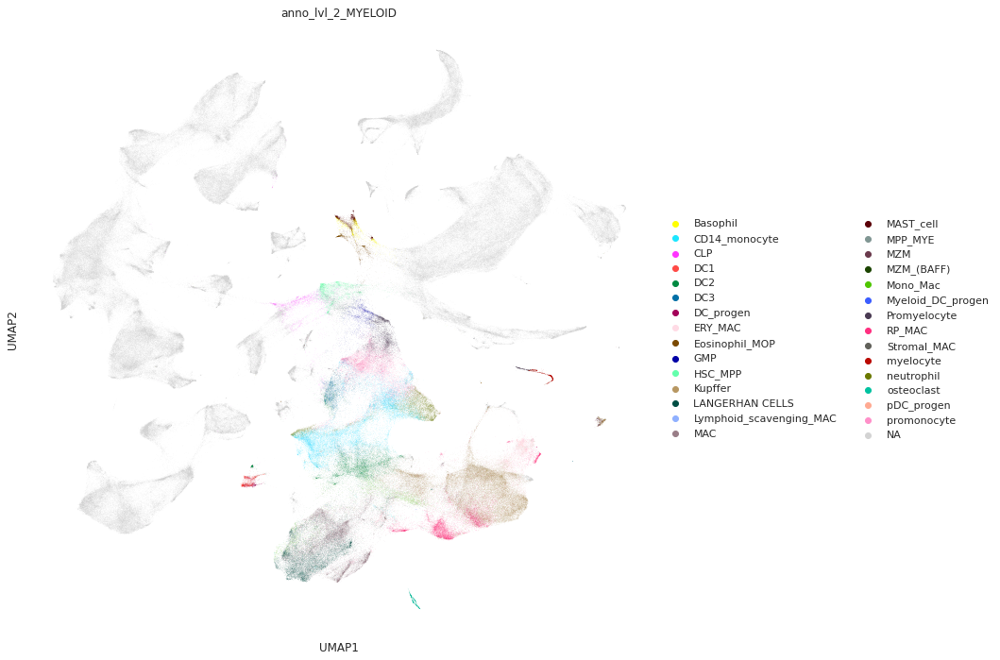

In [278]:
sns.set(font_scale=1) 
plt.rcParams["figure.figsize"] = [12,12]
plt.rcParams['figure.facecolor'] = "white"
plt.rcParams['axes.facecolor'] = "white"
sc.pl.umap(adata, color=["anno_lvl_2_MYELOID"], 
#            groups=pl_labels,
#            legend_loc="on data", size=1,
#           title="ERITHROID/MK"
          )

NotImplementedError: isna is not defined for MultiIndex

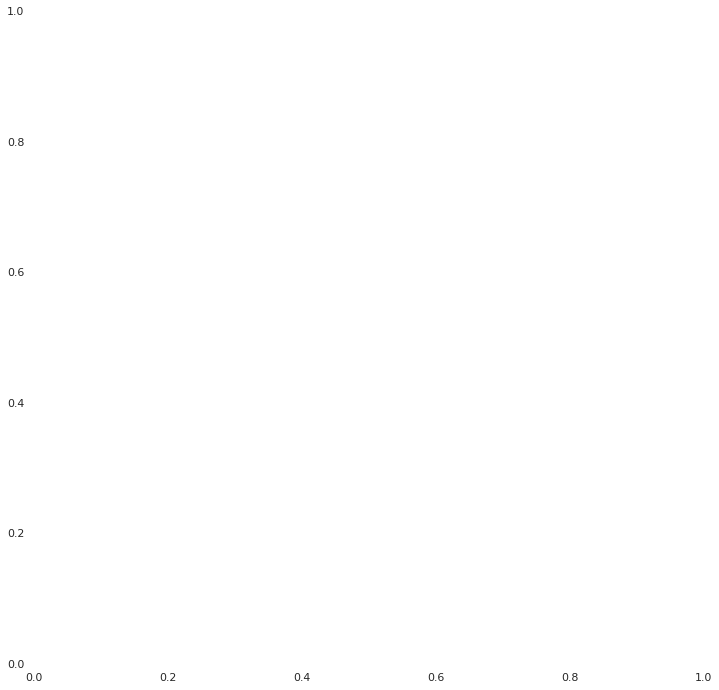

In [275]:
sc.pl.umap(adata, color=["anno_lvl_2_MEM_PROGENITORS"], legend_loc="on data")
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], legend_loc="on data")
sc.pl.umap(adata, color=["anno_lvl_2_MYELOID"], legend_loc="on data")

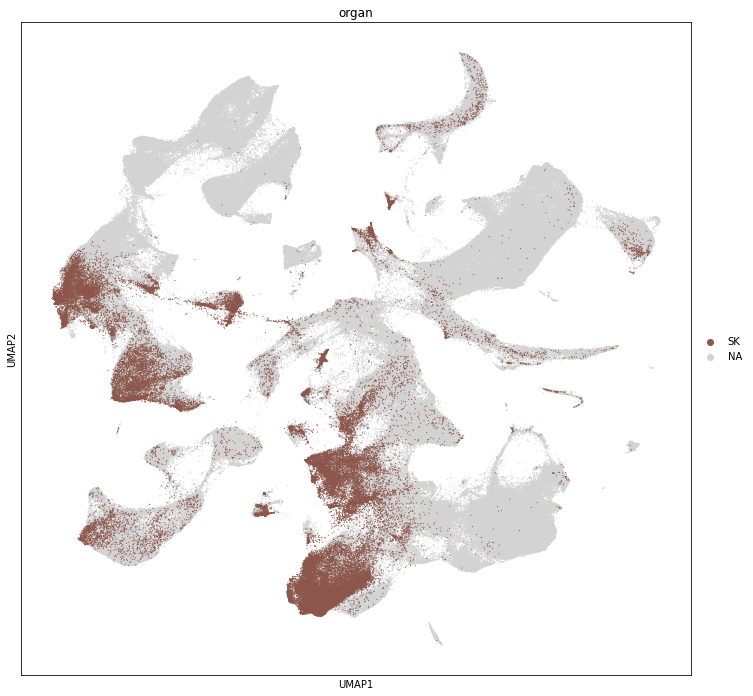

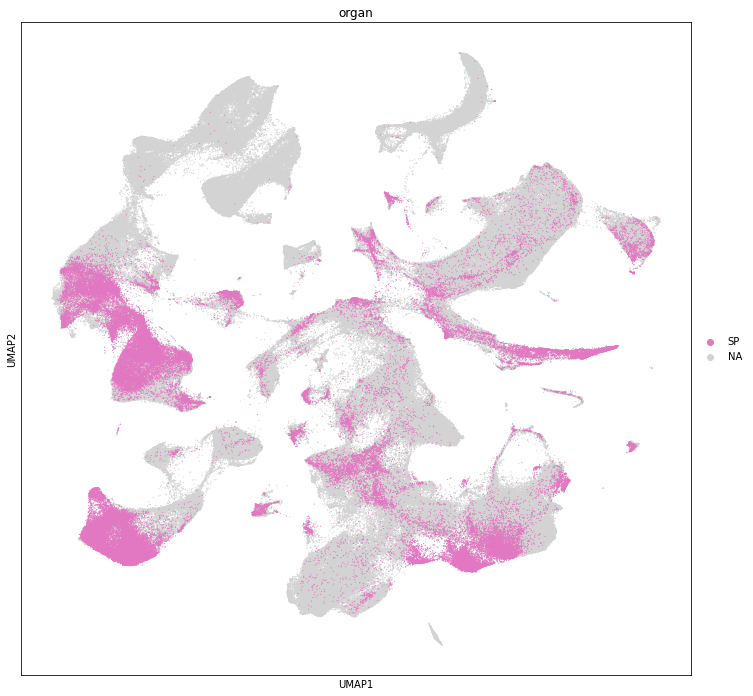

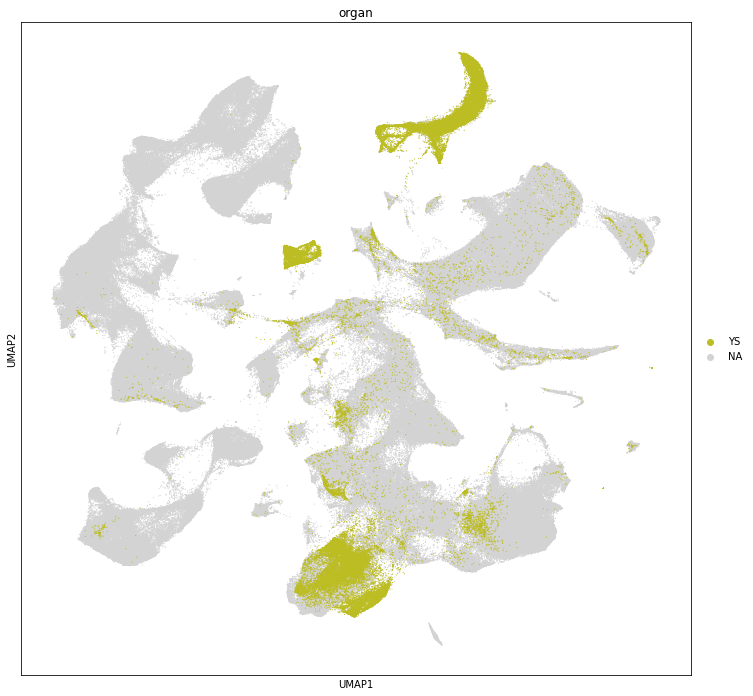

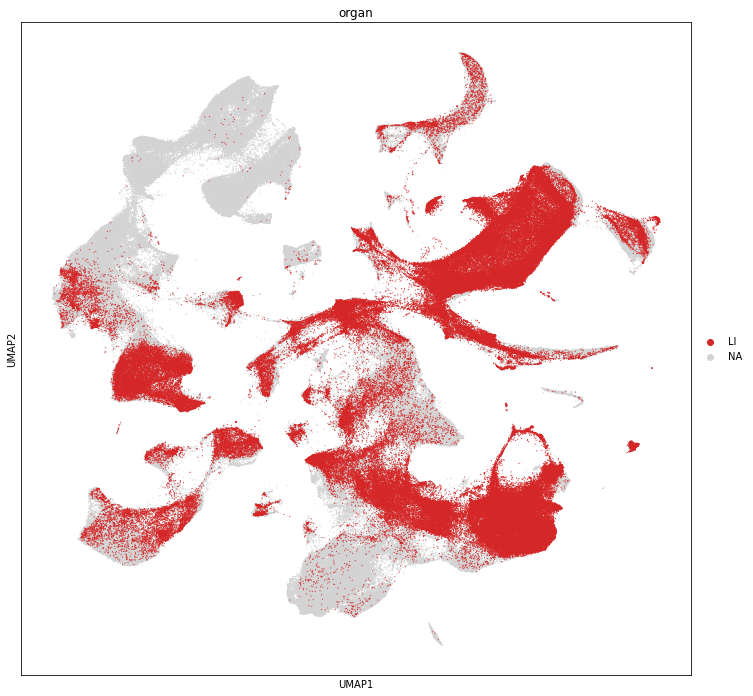

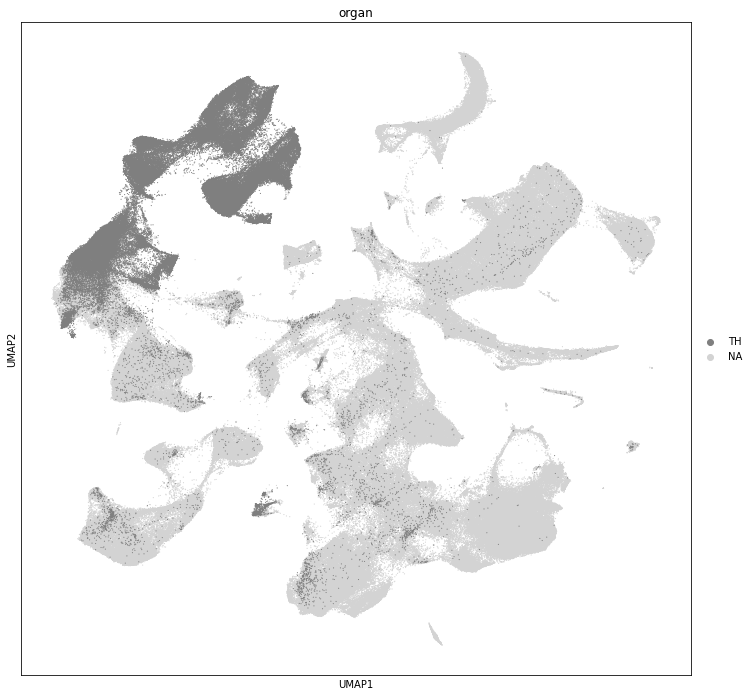

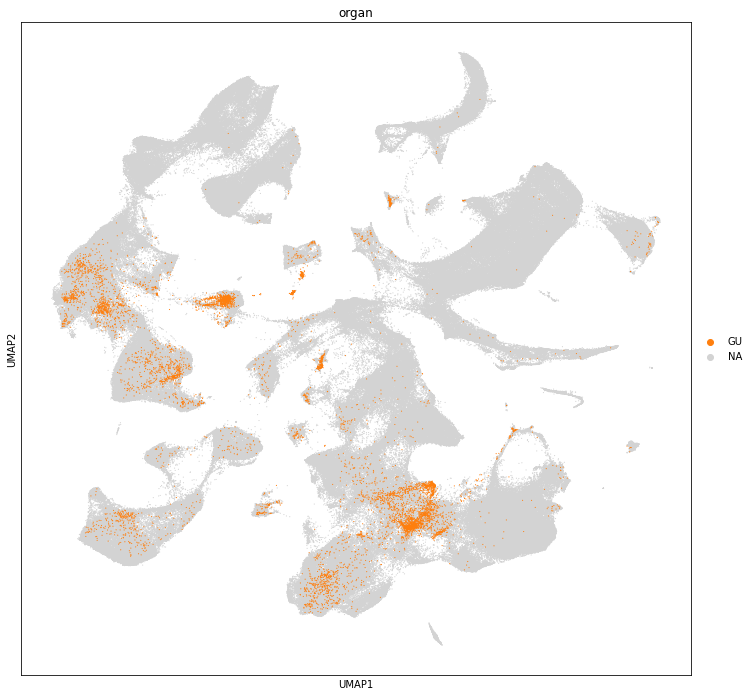

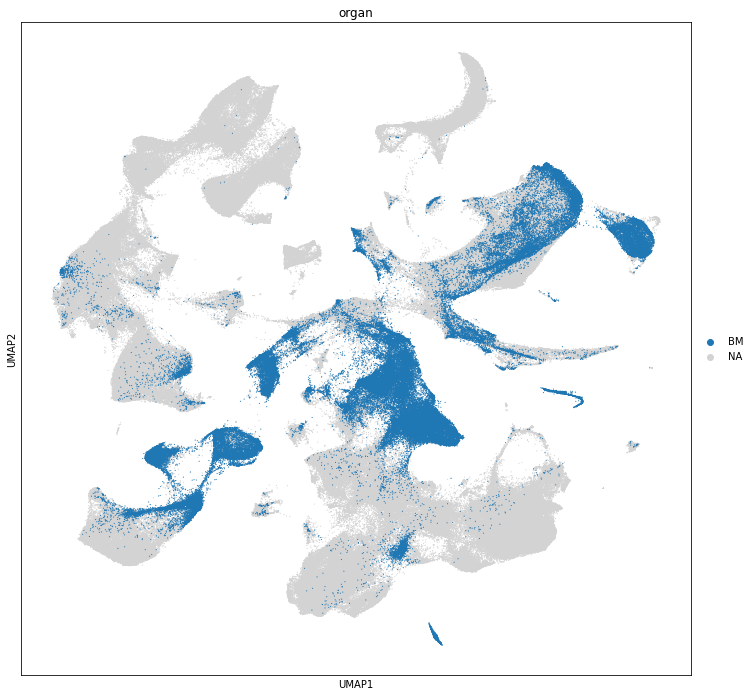

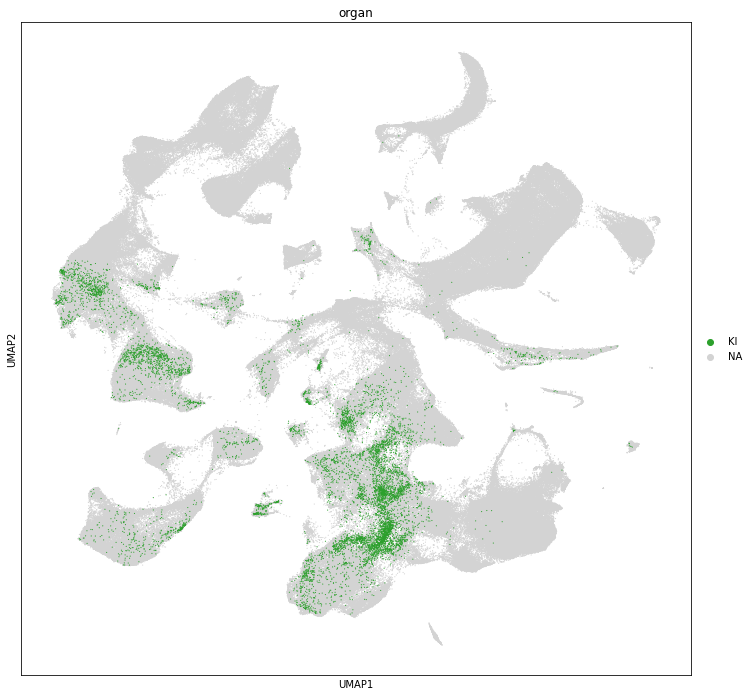

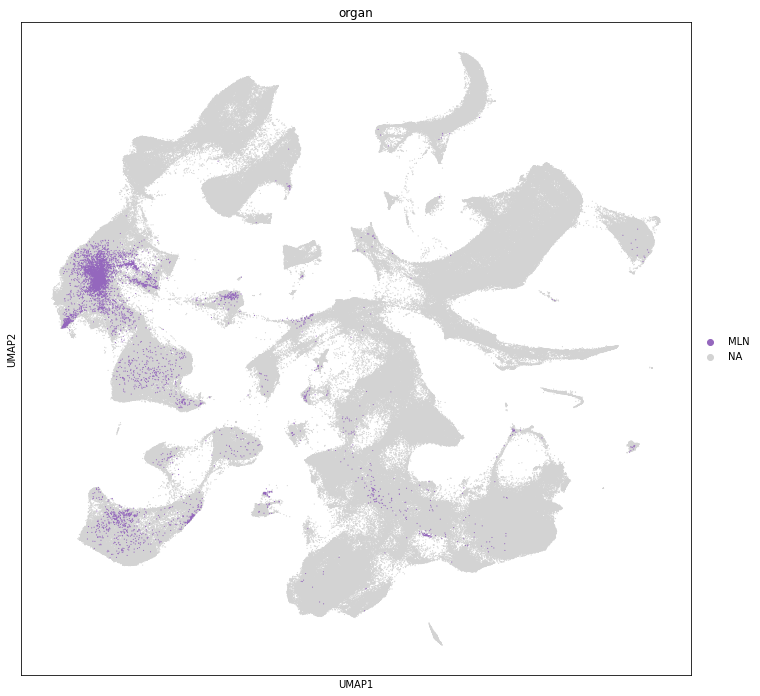

In [86]:
for o in adata.obs['organ'].unique():
    sc.pl.umap(adata, color=["organ"], groups=[o], size=5)

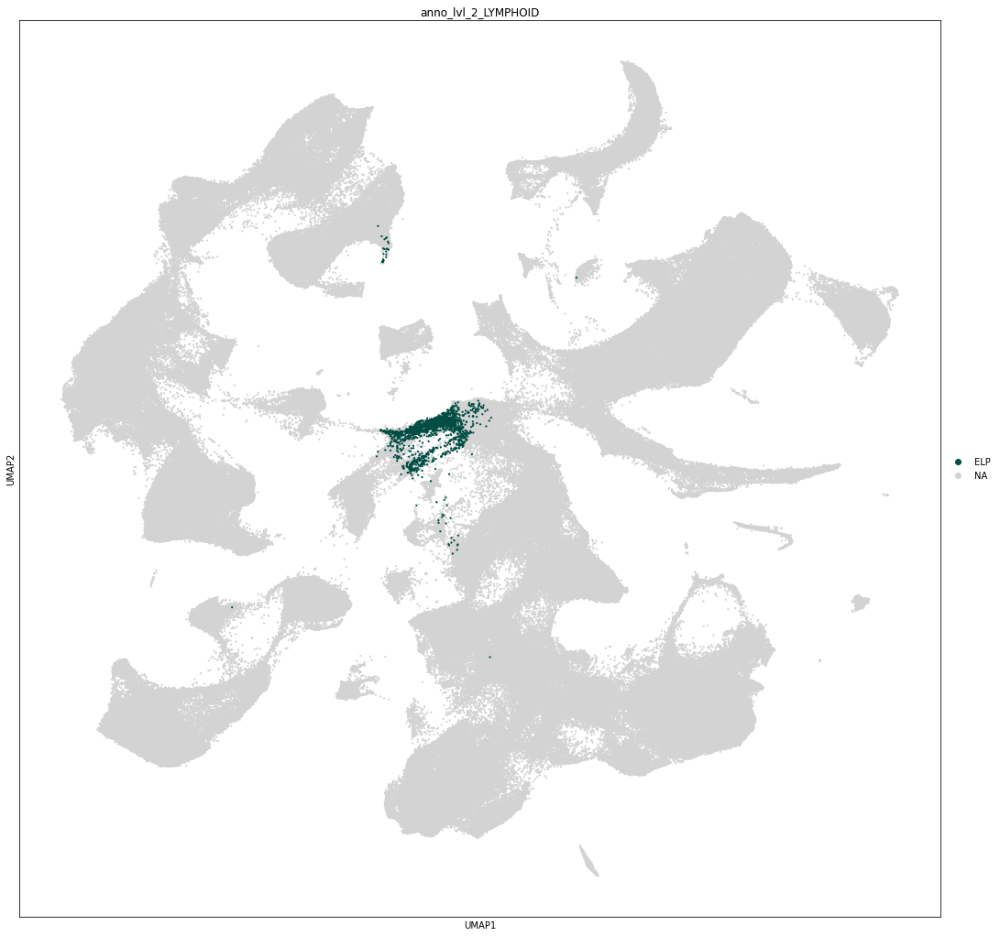

In [88]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], size=20, ncols=3, groups=["ELP"])

In [91]:
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

### Random MOFA analysis

In [80]:
mofa_w = pd.read_csv("/home/jovyan/MOFA_weights.csv", index_col=0)

In [90]:
mofa_w = mofa_w[mofa_w.index.isin(adata.var_names)]

In [92]:
mofa_adata = adata[:,mofa_w.index]

In [97]:
anno_dir = "/nfs/team205/ed6/bin/Pan_fetal_immune/metadata/manual_annotation/"
anno_df = pd.read_csv(anno_dir + 'PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.csv', index_col=0)

In [98]:
mofa_adata.obs = pd.concat([mofa_adata.obs, anno_df],1)

In [95]:
ct_oi = ["LATE PRO B CELL","MATURE B CELL"    ,"SMALL PRE B CELL"]

In [101]:
mofa_adata_ct = mofa_adata[mofa_adata.obs["anno_lvl_2"].isin(ct_oi)]

In [162]:
sc.pp.scale(mofa_adata_ct)

In [164]:
m1 = mofa_w.T.dot(mofa_adata_ct.X.T).T
# m2 = mofa_adata_ct[0:10,:].X.toarray().dot(mofa_w.values)

In [145]:
del mofa_adata_ct.uns['anno_lvl_2_colors']

In [165]:
mofa_adata_ct.obs["Factor1"] = m1["Factor1"].values
mofa_adata_ct.obs["Factor2"] = m1["Factor2"].values

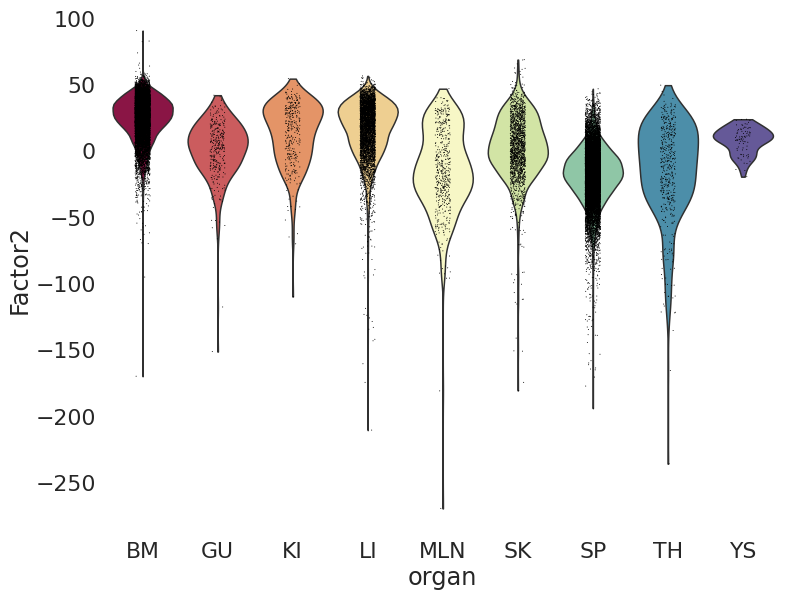

In [171]:
sc.pl.violin(mofa_adata_ct, "Factor2", groupby="organ")

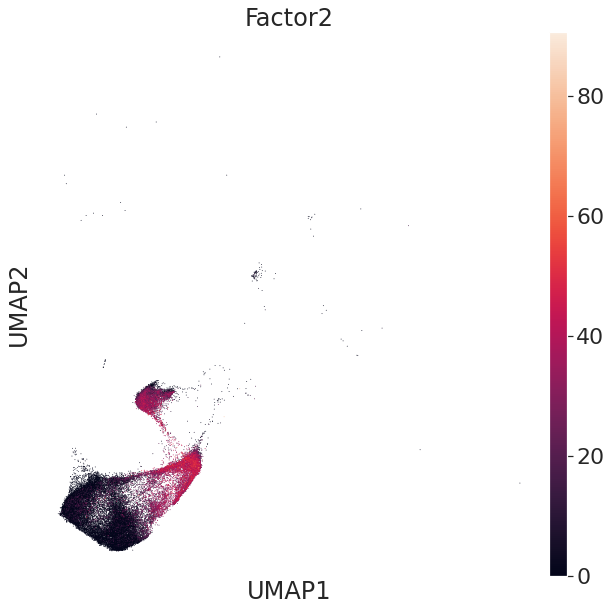

In [169]:
sc.pl.heatmap(mofa_adata_ct, "Factor2", groupby="organ")